# Wine Quality dataset:

The dataset contains different chemical information about wine. It has 1599 records with 12 variables each (11 physico chemical parameters and one output variable, quality score, based on sensory data). All 11 input variables are continuous variables. The output variable, quality, is an integer in the range of 3 to 8, even if the variable is continuous it could be treated as an ordinal or categorical variable.

Reference: P. Cortez, A. Cerdeira, F. Almeida, T. Matos and J. Reis. Modelling wine preferences by data mining from physicochemical properties. In Decision Support Systems, Elsevier, 47(4):547-553. ISSN: 0167-9236.

The dataset is good for classification and regression tasks.The model can be used to predict wine quality.

# Wine industry context

To support the growth of wine Industries are investing in new technologies for both wines making and the selling process. 
Quality assessment can be used to improve winemaking (by identifying most influential factors) and stratify wines when setting prices in the market. 
Quality assessment is based on physicochemical test or sensory tests. 
Phyysicochemical lab test is used to characterize wine into determination of density, alcohol or pH values, while sensory test relies on human experts. 
The relationship between physicochemical and sensory analysis is complex and still not fully understood.

# Business questions: 

What makes up a good wine? 

What are the most important parameters affecting the quality of red wine? 

What are the main differences between a bad and a good red wine quality?

The answer of these questions can help wine makers to improve their wine quality and revenue

This miniproject is about exploring and analysing a dataset on physico-chemical characteristics and quality score of red wine samples by using exploratory data analysis techniques. The main objective of this miniproject was to find the chemical properties that affect the quality of red wines.

# Import required packages

In [187]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
import seaborn as sns

import math
import statistics

from scipy import stats

from sklearn.preprocessing import PowerTransformer, QuantileTransformer

from sklearn import datasets
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score 

# Cause plots to be displayed in the notebook:# %pylab & %matplotlib inlice: Magic function that allows import matplotlib NumPy modules
%pylab inline 
%matplotlib inline

Populating the interactive namespace from numpy and matplotlib


In [188]:
# As a good practice, displaying the library version numbers for future reference:
print('Numpy: ', np.__version__)
print('Pandas: ', pd.__version__)

Numpy:  1.19.2
Pandas:  1.1.3


In [189]:
# Loading the dataset using pd.read_csv
wine = pd.read_csv("winequality-red.csv")

# Dataset morphology

In [190]:
# To know how many rows and columns are in the dataset using .shape
wine.shape

(1599, 12)

In [191]:
# To know the name of the columns of the dataset using .columns
wine.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [192]:
# To know what are the data types of these columns using .dtypes
wine.dtypes

fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
dtype: object

In [193]:
# To know is there is a (row) index for this DataFrame using .index
wine.index

RangeIndex(start=0, stop=1599, step=1)

In [194]:
# To get a concise summary and quick overview of the dataframe before doing EDA using info() function
wine.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [195]:
# To get the first five rows of the dataset using the head() function
wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [196]:
# To get the last five rows of the dataset using the tail() function
wine.tail()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5
1598,6.0,0.310,0.47,3.6,0.067,18.0,42.0,0.99549,3.39,0.66,11.0,6


# EDA - Exploratory Data Analysis

# 1. Handling missing values

In [197]:
# Detecting if the dataset has missing values using isnull() function
wine.isnull()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,False,False,False,False,False,False,False,False,False,False,False,False
1595,False,False,False,False,False,False,False,False,False,False,False,False
1596,False,False,False,False,False,False,False,False,False,False,False,False
1597,False,False,False,False,False,False,False,False,False,False,False,False


In [198]:
# If there are missing values, they can be count using isnull() in combination with .sum() function
# It is clear that there are not missing values for any of the 12 variables.
wine.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

# 2. Data profiling

Counts

In [199]:
# If there are categorical variables in the dataset, it is good to know how many possible values there are in each column. 
# In this case the variable quality could be also understood as an ordinal variable, what is the range of the wine quality dataset?
wine['quality'].value_counts()

5    681
6    638
7    199
4     53
8     18
3     10
Name: quality, dtype: int64

Ranges


In [200]:
# To check minimun and maximum value of all columns defining a function
def check_min_max(wine):
    # Check min, max of each column
    print(wine.describe().T[['min', 'max']])

In [201]:
check_min_max(wine)

                          min        max
fixed acidity         4.60000   15.90000
volatile acidity      0.12000    1.58000
citric acid           0.00000    1.00000
residual sugar        0.90000   15.50000
chlorides             0.01200    0.61100
free sulfur dioxide   1.00000   72.00000
total sulfur dioxide  6.00000  289.00000
density               0.99007    1.00369
pH                    2.74000    4.01000
sulphates             0.33000    2.00000
alcohol               8.40000   14.90000
quality               3.00000    8.00000


In [202]:
# To check minimun and maximum value of all columns defining a function
def check_min_max(df):
    # Check min, max of each column
    print(df.describe().T[['min', 'max']])

In [203]:
check_min_max(wine)

                          min        max
fixed acidity         4.60000   15.90000
volatile acidity      0.12000    1.58000
citric acid           0.00000    1.00000
residual sugar        0.90000   15.50000
chlorides             0.01200    0.61100
free sulfur dioxide   1.00000   72.00000
total sulfur dioxide  6.00000  289.00000
density               0.99007    1.00369
pH                    2.74000    4.01000
sulphates             0.33000    2.00000
alcohol               8.40000   14.90000
quality               3.00000    8.00000


In [204]:
# To display the main statistical features of the whole dataset
wine.describe().T

,count,mean,std,min,25%,50%,75%,max
fixed acidity,1599.0,8.319637,1.741096,4.60000,7.1000,7.90000,9.200000,15.90000
volatile acidity,1599.0,0.527821,0.179060,0.12000,0.3900,0.52000,0.640000,1.58000
citric acid,1599.0,0.270976,0.194801,0.00000,0.0900,0.26000,0.420000,1.00000
residual sugar,1599.0,2.538806,1.409928,0.90000,1.9000,2.20000,2.600000,15.50000
chlorides,1599.0,0.087467,0.047065,0.01200,0.0700,0.07900,0.090000,0.61100
free sulfur dioxide,1599.0,15.874922,10.460157,1.00000,7.0000,14.00000,21.000000,72.00000
total sulfur dioxide,1599.0,46.467792,32.895324,6.00000,22.0000,38.00000,62.000000,289.00000
density,1599.0,0.996747,0.001887,0.99007,0.9956,0.99675,0.997835,1.00369
pH,1599.0,3.311113,0.154386,2.74000,3.2100,3.31000,3.400000,4.01000
sulphates,1599.0,0.658149,0.169507,0.33000,0.5500,0.62000,0.730000,2.00000


In [205]:
# To split the data into separate groups to perform computations for better analysis using groupby()
wine.groupby('quality').count()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
quality,,,,,,,,,,,
3,10,10,10,10,10,10,10,10,10,10,10
4,53,53,53,53,53,53,53,53,53,53,53
5,681,681,681,681,681,681,681,681,681,681,681
6,638,638,638,638,638,638,638,638,638,638,638
7,199,199,199,199,199,199,199,199,199,199,199
8,18,18,18,18,18,18,18,18,18,18,18


In [206]:
# Using .loc to select rows from the DataFrame based on the 2 highest quality values to increase sample size
wine_high = wine.loc[wine['quality'] >=7]

In [207]:
wine_high.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000
mean,8.847005,0.405530,0.376498,2.708756,0.075912,13.981567,34.889401,0.996030,3.288802,0.743456,11.518049,7.082949
std,1.999977,0.144963,0.194438,1.363026,0.028480,10.234615,32.572238,0.002201,0.154478,0.134038,0.998153,0.276443
min,4.900000,0.120000,0.000000,1.200000,0.012000,3.000000,7.000000,0.990640,2.880000,0.390000,9.200000,7.000000
25%,7.400000,0.300000,0.300000,2.000000,0.062000,6.000000,17.000000,0.994700,3.200000,0.650000,10.800000,7.000000
50%,8.700000,0.370000,0.400000,2.300000,0.073000,11.000000,27.000000,0.995720,3.270000,0.740000,11.600000,7.000000
75%,10.100000,0.490000,0.490000,2.700000,0.085000,18.000000,43.000000,0.997350,3.380000,0.820000,12.200000,7.000000
max,15.600000,0.915000,0.760000,8.900000,0.358000,54.000000,289.000000,1.003200,3.780000,1.360000,14.000000,8.000000


In [208]:
# Using .loc to select rows from the DataFrame based on the two lowest quality values to increase sample size
wine_low = wine.loc[wine['quality'] <=4]

In [209]:
wine_low.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000
mean,7.871429,0.724206,0.173651,2.684921,0.095730,12.063492,34.444444,0.996689,3.384127,0.592222,10.215873,3.841270
std,1.649284,0.247970,0.207406,1.723735,0.075121,9.076508,26.395123,0.001667,0.175100,0.224323,0.918178,0.368359
min,4.600000,0.230000,0.000000,1.200000,0.045000,3.000000,7.000000,0.993400,2.740000,0.330000,8.400000,3.000000
25%,6.800000,0.565000,0.020000,1.900000,0.068500,5.000000,13.500000,0.995655,3.300000,0.495000,9.600000,4.000000
50%,7.500000,0.680000,0.080000,2.100000,0.080000,9.000000,26.000000,0.996600,3.380000,0.560000,10.000000,4.000000
75%,8.400000,0.882500,0.270000,2.950000,0.094500,15.500000,48.000000,0.997700,3.500000,0.600000,11.000000,4.000000
max,12.500000,1.580000,1.000000,12.900000,0.610000,41.000000,119.000000,1.001000,3.900000,2.000000,13.100000,4.000000


In [210]:
wine_medium= wine.loc[(wine['quality'] >4) & (wine['quality'] <7)]

In [211]:
wine_medium.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1319.000000,1319.000000,1319.000000,1319.000000,1319.000000,1319.000000,1319.000000,1319.000000,1319.000000,1319.000000,1319.000000,1319.000000
mean,8.254284,0.538560,0.258264,2.503867,0.088973,16.368461,48.946929,0.996867,3.311296,0.647263,10.252717,5.483700
std,1.682935,0.167679,0.187995,1.399633,0.047538,10.492335,32.714030,0.001815,0.152345,0.167334,0.972354,0.499924
min,4.700000,0.160000,0.000000,0.900000,0.034000,1.000000,6.000000,0.990070,2.860000,0.370000,8.400000,5.000000
25%,7.100000,0.410000,0.090000,1.900000,0.071000,8.000000,24.000000,0.995800,3.210000,0.540000,9.500000,5.000000
50%,7.800000,0.540000,0.240000,2.200000,0.080000,14.000000,40.000000,0.996800,3.310000,0.610000,10.000000,5.000000
75%,9.100000,0.640000,0.400000,2.600000,0.091000,22.000000,65.000000,0.997900,3.400000,0.700000,10.900000,6.000000
max,15.900000,1.330000,0.790000,15.500000,0.611000,72.000000,165.000000,1.003690,4.010000,1.980000,14.900000,6.000000


In [212]:
# Inserting a new column in the database based on wine quality condition: rating (high, medium and low)
rating =[]
for row in wine['quality']:
    if row <= 4: rating.append('Low')
    elif row >=7: rating.append('High')
    else: rating.append('Medium')   

In [213]:
# To make sure the function above is running
wine['rating'] = rating
print(wine)

      fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0               7.4             0.700         0.00             1.9      0.076   
1               7.8             0.880         0.00             2.6      0.098   
2               7.8             0.760         0.04             2.3      0.092   
3              11.2             0.280         0.56             1.9      0.075   
4               7.4             0.700         0.00             1.9      0.076   
...             ...               ...          ...             ...        ...   
1594            6.2             0.600         0.08             2.0      0.090   
1595            5.9             0.550         0.10             2.2      0.062   
1596            6.3             0.510         0.13             2.3      0.076   
1597            5.9             0.645         0.12             2.0      0.075   
1598            6.0             0.310         0.47             3.6      0.067   

      free sulfur dioxide  

In [214]:
# To know about the wine rating group sizes 
wine.groupby('rating').count()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
rating,,,,,,,,,,,,
High,217,217,217,217,217,217,217,217,217,217,217,217
Low,63,63,63,63,63,63,63,63,63,63,63,63
Medium,1319,1319,1319,1319,1319,1319,1319,1319,1319,1319,1319,1319


In [215]:
# To return number of unique elements in the dataset, the function counts of all the unique values in the Index.
wine.nunique()

fixed acidity            96
volatile acidity        143
citric acid              80
residual sugar           91
chlorides               153
free sulfur dioxide      60
total sulfur dioxide    144
density                 436
pH                       89
sulphates                96
alcohol                  65
quality                   6
rating                    3
dtype: int64

###### From above, we can observe that
###### 1.There are 12 cols and 1599 data rows.
###### 2.The data does not contain any null values.
###### 3.There are 6 different qualities of wine.

In [216]:
# Import package and performing data profiling for the dataset
import pandas_profiling
pandas_profiling.ProfileReport(wine)

# 3. Histograms of continuos variables of the dataset

####  To be able to see the distribution of all continuos variables

In [217]:
# Loading the dataset using pd.read_csv
wine = pd.read_csv("winequality-red.csv")

In [218]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import pandas

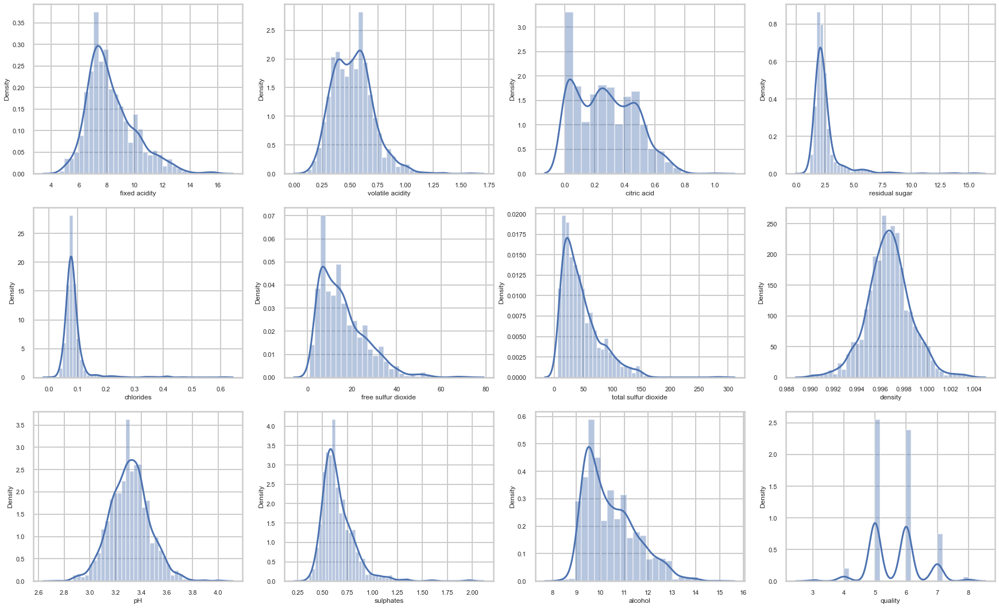

In [219]:
plt.figure(figsize=(30,25))
for i, c in enumerate(wine):
    plt.subplot(4,4, i+1)
    sns.distplot(wine[c])

plt.show()

# Looking at the distributions plotted below it is clear that the majority of the variables have a normal distribution and that some of them need a transformation due to the skewness.

# 4. Plotting to know how continuous variables are distributed against wine quality

[Text(0, 0.5, 'fixed acidity (tartaric acid - g/dm3)')]

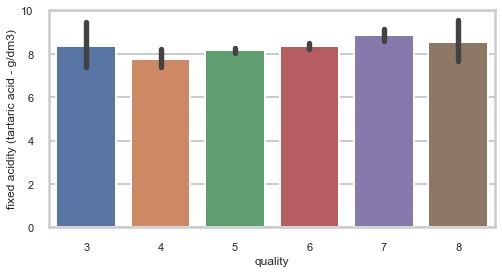

In [220]:
# When plotting fixed acidity there is not any clear trend to explaing the different levels of wine quality.
# Acidity affects taste and pH. Acidity provides some of the backbone needed for long-term aging, so high acid wines are more likely to improve with time than those with lesser amounts.
# It affects other attributes such as pH, color, taste, and stability to oxidation (prevent the wine from tasting flat). 
fig = plt.figure(figsize = (8,4))
ax = sns.barplot(x = 'quality', y = 'fixed acidity', data = wine)
ax.set(ylabel='fixed acidity (tartaric acid - g/dm3)')

[Text(0, 0.5, 'volatile acidity (acetic acid - g/dm3)')]

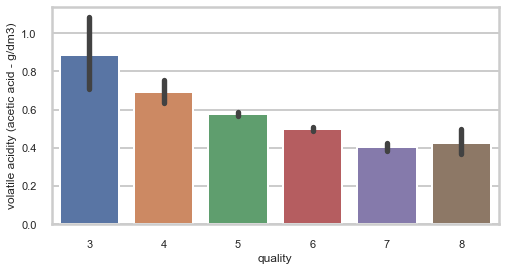

In [221]:
# When plotting volatile acidity there is a downing trend as the wine quality increases. 
# Volatile acidity is an important sensory parameter, with higher levels indicating wine spoilage.
# Volatile acidity affects taste in wine (sourness if too high and dense if too low).
fig = plt.figure(figsize = (8,4))
ax = sns.barplot(x = 'quality', y = 'volatile acidity', data = wine)
ax.set(ylabel='volatile acidity (acetic acid - g/dm3)')

[Text(0, 0.5, 'citric acid (g/dm3)')]

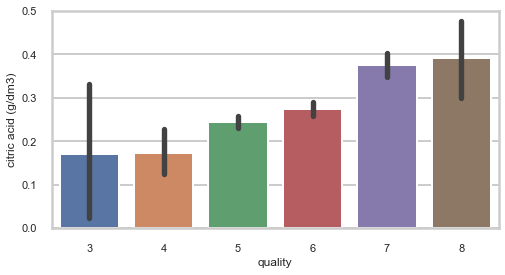

In [222]:
# Citric acid go higher as the quality of the wine increases.
# Citric acid can impart specific flavours and additional acidity to wine
fig = plt.figure(figsize = (8,4))
ax= sns.barplot(x = 'quality', y = 'citric acid', data = wine)
ax.set(ylabel= 'citric acid (g/dm3)')

[Text(0, 0.5, 'residual sugar (g/dm3)')]

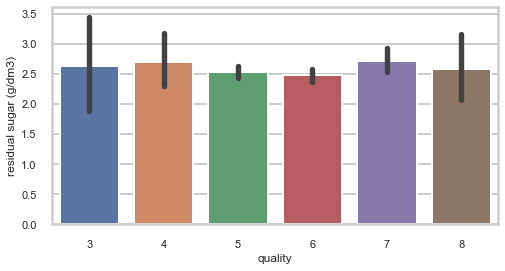

In [223]:
# When plotting residual sugar there is not any clear trend to explaing the different levels of wine quality.
# Residual sugar may help a sharp, acidic wine to taste mellower and a plain wine more flavoursome.
fig = plt.figure(figsize = (8,4))
ax = sns.barplot(x = 'quality', y = 'residual sugar', data = wine)
ax.set(ylabel='residual sugar (g/dm3)')

[Text(0, 0.5, 'chlorides (sodium chloride - g/dm3)')]

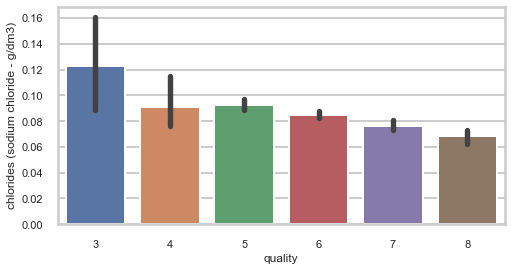

In [224]:
# When plotting chlorides there is a downing trend as the wine quality increases. 
# Wine flavor is strongly impacted by Chlorides, in high concentration, gives the wine an undesirable salty taste and significantly decreases its market appeal.
# The perceived quality of wine declines as the amount of chlorides increases
fig = plt.figure(figsize = (8,4))
ax = sns.barplot(x = 'quality', y = 'chlorides', data = wine)
ax.set(ylabel='chlorides (sodium chloride - g/dm3)')

[Text(0, 0.5, 'free sulfur dioxide (mg/dm3)')]

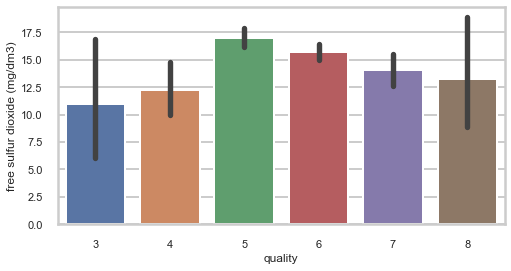

In [225]:
# When plotting free sulfur dioxide there is not any clear trend to explaing the different levels of wine quality.
# Free sulfur dioxide is added as a preservative to prevent bacterial growth and slow down the process of oxidation by inhibiting oxidative enzymes. 
# SO2 also improves the taste and retains the wine's fruity flavors and freshness of aroma
fig = plt.figure(figsize = (8,4))
ax = sns.barplot(x = 'quality', y = 'free sulfur dioxide', data = wine)
ax.set(ylabel='free sulfur dioxide (mg/dm3)')

[Text(0, 0.5, 'total sulfur dioxide (mg/dm3)')]

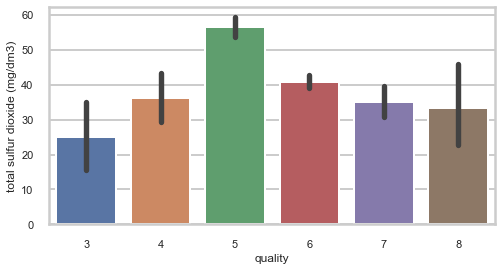

In [226]:
# When plotting total sulfur dioxide there is not any clear trend to explaing the different levels of wine quality.
# Too much total sulfur dioxide can be perceptible to consumers, by masking the wine's own fruity aromas and inhibiting its ability to undergo the cascade of oxygen-using reactions that happen when it “breathes,” or, in high enough concentrations, by contributing a sharp/bitter/metallic/chemical flavor or sensation
fig = plt.figure(figsize = (8,4))
ax=sns.barplot(x = 'quality', y = 'total sulfur dioxide', data = wine)
ax.set(ylabel='total sulfur dioxide (mg/dm3)')

[Text(0, 0.5, 'density (g/dm3)')]

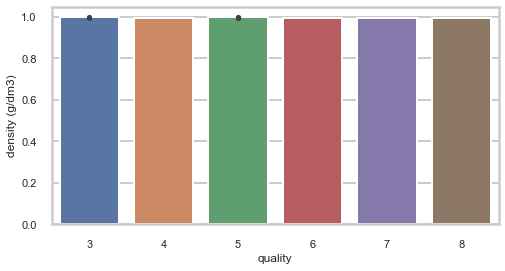

In [227]:
# When plotting density there is not any clear trend to explaing the different levels of wine quality.
# As density increases, perceived quality declines. Density exerts a great influence on the body of wines
fig = plt.figure(figsize = (8,4))
ax=sns.barplot(x = 'quality', y = 'density', data = wine)
ax.set(ylabel='density (g/dm3)')

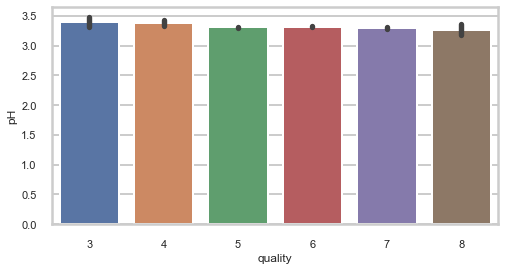

In [228]:
# When plotting pH there is not any clear trend to explaing the different levels of wine quality.
# pH affects color, taste and smell
# Low pH wines will taste tart and crisp, while higher pH wines are more susceptible to bacterial growth. Most wine pH's fall around 3 or 4; about 3.3 to 3.6 is best for reds.
fig = plt.figure(figsize = (8,4))
ax=sns.barplot(x = 'quality', y = 'pH', data = wine)

[Text(0, 0.5, 'sulphates (potassium sulphate - g/dm3)')]

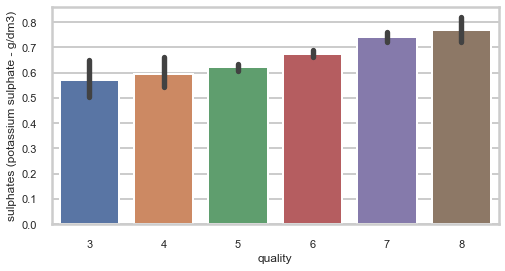

In [229]:
# Sulphates level goes higher with the quality of wine
# Sulphates are used as preservatives and prevent oxidation
fig = plt.figure(figsize = (8,4))
ax=sns.barplot(x = 'quality', y = 'sulphates', data = wine)
ax.set(ylabel='sulphates (potassium sulphate - g/dm3)')

[Text(0, 0.5, 'alcohol(% by volume)')]

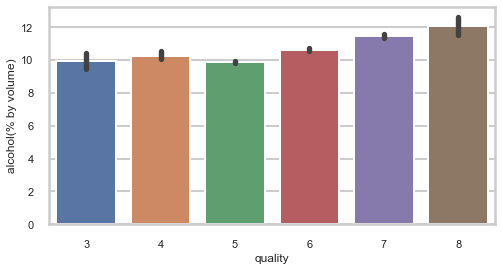

In [230]:
# Alcohol level also goes higher with the quality of wine
# Alcohol is important for wine sensory sensations but also by their interaction with other wine components (aromas, tannins), also has an influence in wine viscosity and body and perception of astringency, sourness, sweetness, aroma, and flavor
# Alcohol also helps balance sweetness and acidity
fig = plt.figure(figsize = (8,4))
ax=sns.barplot(x = 'quality', y = 'alcohol', data = wine)
ax.set(ylabel='alcohol(% by volume)')

# 5. Scattering plots of pair of variables with high Pearson's correlation


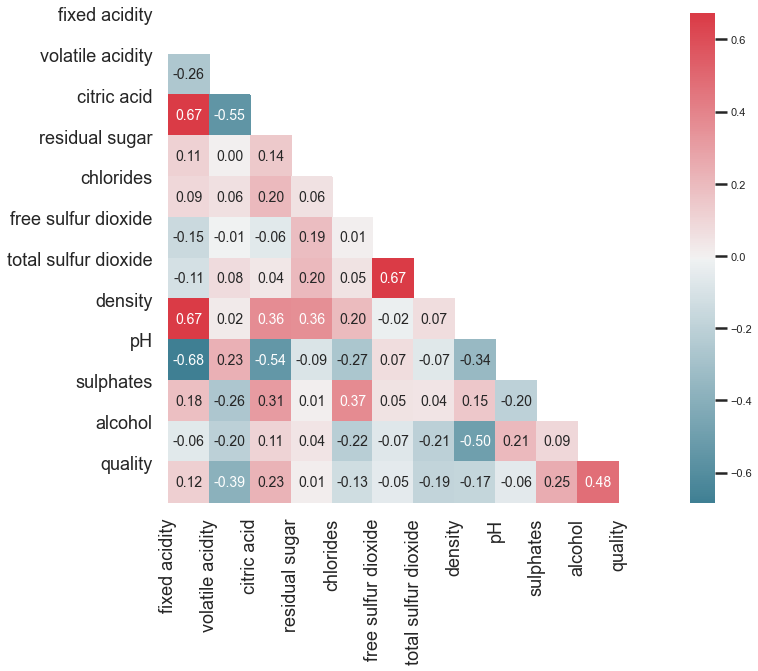

In [231]:
# To plot a heatmap using seaborne to visualise the correlation between the different variables of the dataset. The heatmap is a correlation matrix.
# The heatmap shows that there is weak to moderate correlations between some of the variables:
# Positive corrleations between fixed acidity and citric acid; fixed acidity and density, and free sulfur dioxide and total sulfur dioxide 
# Negative correlation bewteen fixed acidity and pH  

corr = wine.corr()
plt.figure(figsize=(11,9))
dropSelf = np.zeros_like(corr)
dropSelf[np.triu_indices_from(dropSelf)] = True

sns.heatmap(corr, cmap=sns.diverging_palette(220, 10, as_cmap=True), annot=True, fmt=".2f", mask=dropSelf, annot_kws={"size":14})

sns.set(font_scale=0.6)

#Apply xticks
plt.xticks(range(len(corr.columns)), corr.columns, fontsize=18);
#Apply yticks
plt.yticks(range(len(corr.columns)), corr.columns, fontsize=18)
#show plot
plt.show()

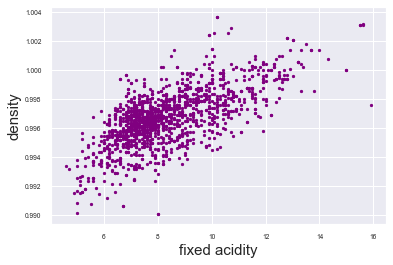

In [232]:
wine.plot(x='fixed acidity', y='density', marker= '.', kind= 'scatter', color = 'purple')
xlabel('fixed acidity', fontsize=15)
ylabel('density', fontsize = 15)
plt.show()
# The plot between fixed acidity and density shows clearly a positive correlation (+0.67) bewteen both variables. It means that, in general, when fixed acitidy increases, density also increases

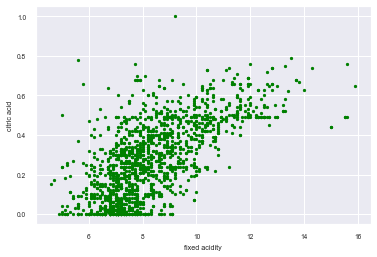

In [233]:
wine.plot(x='fixed acidity', y='citric acid', marker= '.', kind= 'scatter', color = 'green')
plt.show()
# The plot between fixed acidity and citric acid also shows clearly a positive correlation (+0.67) bewteen both variables. It means that, in general, when fixed acitidy increases, citric acidity also increases

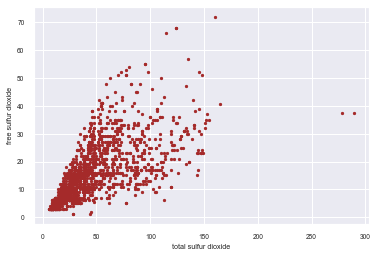

In [234]:
wine.plot(x='total sulfur dioxide', y='free sulfur dioxide', marker= '.', kind= 'scatter', color = 'brown')
plt.show()
# The plot between total sulfur dioxide and free sulfur dioxide also shows clearly a positive correlation (+0.67) bewteen both variables. It means that, in general, when total sulfur dioxide increases, free sulfur dioxide also increases

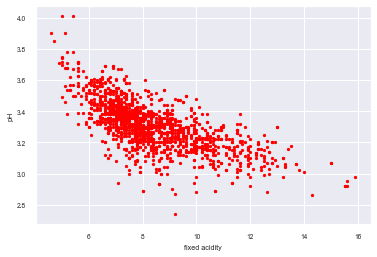

In [235]:
wine.plot(x='fixed acidity', y='pH', marker= '.', kind= 'scatter', color = 'red')
plt.show()
# The plot between fixed acidity and pH shows clearly a negative correlation (-0.68) bewteen both variables. It means that, in general, when fixed acitidy increases, pH decreases

In [236]:
# Inserting a new column in the database based on wine quality condition: rating (high, medium and low)
rating =[]
for row in wine['quality']:
    if row <= 4: rating.append('Low')
    elif row >=7: rating.append('High')
    else: rating.append('Medium')   

In [237]:
wine['rating'] = rating

In [238]:
# To know about the wine rating group sizes 
wine.groupby('rating').count()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
rating,,,,,,,,,,,,
High,217,217,217,217,217,217,217,217,217,217,217,217
Low,63,63,63,63,63,63,63,63,63,63,63,63
Medium,1319,1319,1319,1319,1319,1319,1319,1319,1319,1319,1319,1319


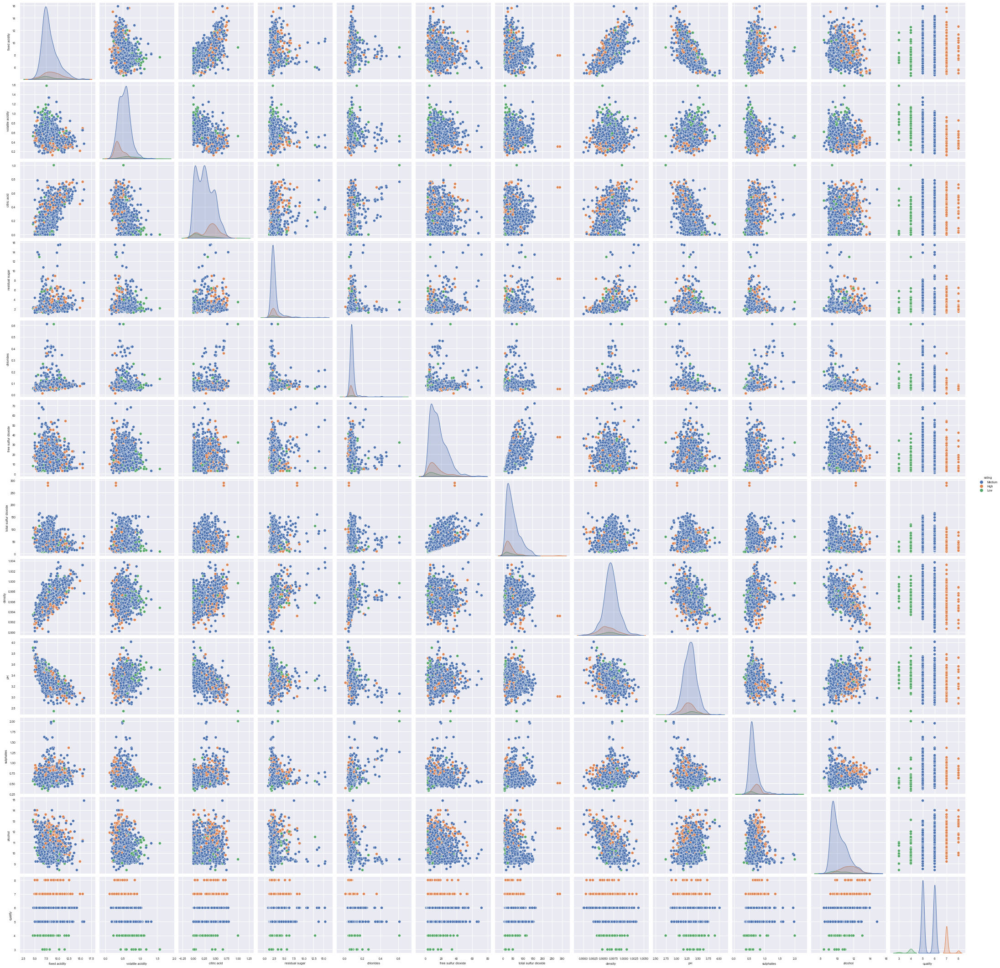

In [239]:
# Pairplot creates a grid of Axes such that each numeric variable in data will by shared across the y-axes across a single row and the x-axes across a single column
# The following pairplot shows the relationship for (n,2) combination of variable in the dataframe based on quality rating groups (high, medium and low).
sns.pairplot(wine, hue= 'rating')

### Using barplots to visualise the difference of the selected variables with moderate to strong correlation agains the wine quality rating group

<AxesSubplot:xlabel='rating', ylabel='fixed acidity'>

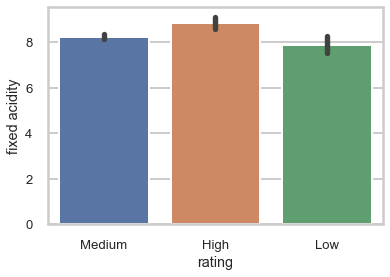

In [240]:
# Bar plot using seaborn
sns.set_theme(style="whitegrid")
sns.set_context('poster', font_scale=0.6)


sns.barplot(x='rating', y='fixed acidity', data=wine)

# This barplot shows that the high quality wine has a higher fixed acidity. This result could not been seen when plotting all the wine quality values against fixed acidity.

<AxesSubplot:xlabel='rating', ylabel='density'>

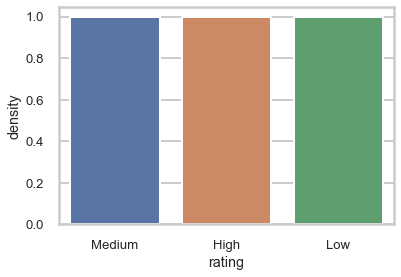

In [241]:
sns.set_theme(style="whitegrid")
sns.set_context('poster', font_scale=0.6)


sns.barplot(x='rating', y='density', data=wine)
# This barplot shows that there is not a clear difference between the three groups of wine when comparing them against density.

<AxesSubplot:xlabel='rating', ylabel='citric acid'>

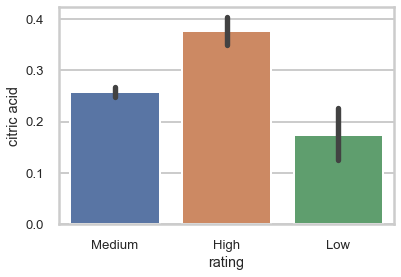

In [242]:
sns.set_theme(style="whitegrid")
sns.set_context('poster', font_scale=0.6)


sns.barplot(x='rating', y='citric acid', data=wine)
# This barplot shows that the high quality wine has a higher citric acid. This result could also been seen when plotting all the wine quality values against citric acid. 
# It is very clear that the citric acid is higher when wine quality is increases.

<AxesSubplot:xlabel='rating', ylabel='free sulfur dioxide'>

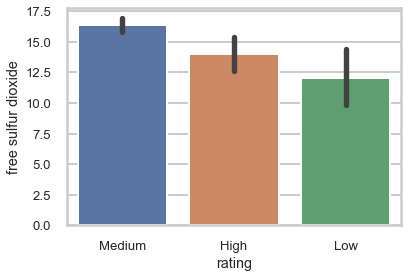

In [243]:
sns.set_theme(style="whitegrid")
sns.set_context('poster', font_scale=0.6)


sns.barplot(x='rating', y='free sulfur dioxide', data=wine)

# This barplot shows that there is a clear difference between the three groups of wine when comparing them against free sulfur dioxide and that perhaps the high quality wine cannot have a very high or low free sulfur dioxide.

<AxesSubplot:xlabel='rating', ylabel='total sulfur dioxide'>

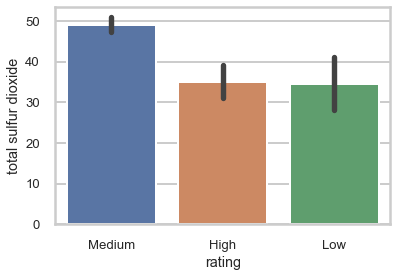

In [244]:
sns.set_theme(style="whitegrid")
sns.set_context('poster', font_scale=0.6)


sns.barplot(x='rating', y='total sulfur dioxide', data=wine)
# This barplot shows that there is not a clear difference between the three groups of wine when comparing them against total sulfur dioxide.

<AxesSubplot:xlabel='rating', ylabel='pH'>

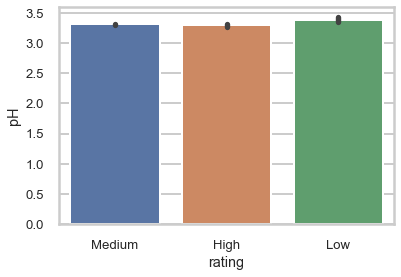

In [245]:
sns.set_theme(style="whitegrid")
sns.set_context('poster', font_scale=0.6)


sns.barplot(x='rating', y='pH', data=wine)
# This barplot shows that there is not a clear difference between the three groups of wine when comparing them against pH. The three groups are within the expected range of 3.3 to 3.6 for best red wines. 

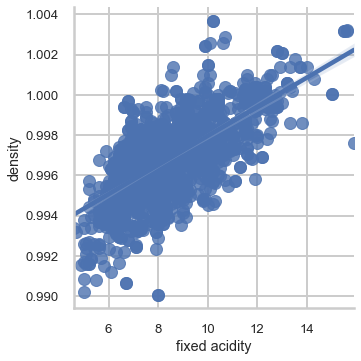

In [246]:
#groupby: medium, low, high quality
#Scatter plot using seaborn and lmplot(). fit_reg = True
sns.lmplot(x='fixed acidity', y= 'density', data= wine, fit_reg = True)

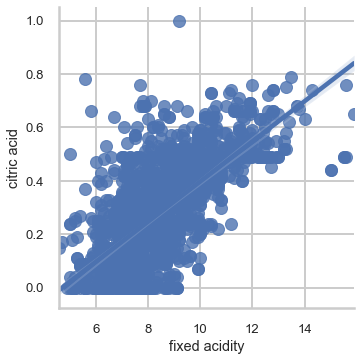

In [247]:
#Scatter plot using seaborn and lmplot().  fit_reg=true (estimate and plot a regression model relating the x and y variables)
sns.lmplot(x='fixed acidity', y= 'citric acid', data= wine, fit_reg = True)

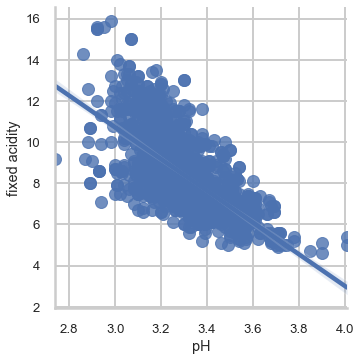

In [248]:
#Scatter plot using seaborn and lmplot(). fit_reg = False
sns.lmplot(x='pH', y= 'fixed acidity', data= wine, fit_reg = True)

In [249]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import pandas

# 6. Detecting, correcting and removing outliers

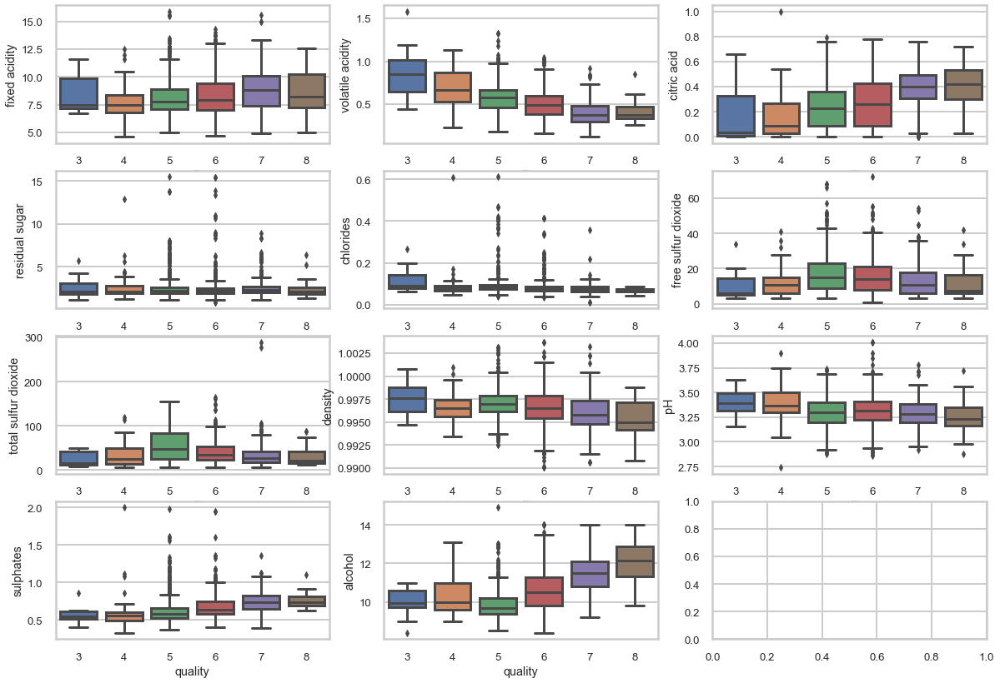

In [250]:
fig, ax1 = plt.subplots(4,3, figsize=(20,14))
k = 0
for i in range(4):
    for j in range(3):
        if k != 11:
            sns.boxplot('quality',wine.iloc[:,k], data=wine, ax = ax1[i][j])
            k += 1
plt.show()

In [251]:
# Calculating z-score, which is the signed number of standard deviations by which the value of an observation or data point is above the mean value of what is being observed or measured.
wine1 = pd.read_csv("winequality-red.csv")
z = np.abs(stats.zscore(wine1, axis=0))
print(z)

[[0.52835961 0.96187667 1.39147228 ... 0.57920652 0.96024611 0.78782264]
 [0.29854743 1.96744245 1.39147228 ... 0.1289504  0.58477711 0.78782264]
 [0.29854743 1.29706527 1.18607043 ... 0.04808883 0.58477711 0.78782264]
 ...
 [1.1603431  0.09955388 0.72391627 ... 0.54204194 0.54162988 0.45084835]
 [1.39015528 0.65462046 0.77526673 ... 0.30598963 0.20930812 0.78782264]
 [1.33270223 1.21684919 1.02199944 ... 0.01092425 0.54162988 0.45084835]]


In [252]:
# Defining a threshold to identify an outlier. 
# As per the empirical rule any absolute value of z-score above 3 is considered as an Outlier. 
threshold = 3
print(np.where(z>3))
# The first array contains the list of row numbers and the second array respective columns numbers.

(array([  13,   14,   15,   15,   17,   17,   19,   33,   38,   42,   43,
         45,   57,   81,   81,   83,   86,   88,   91,   92,   95,  106,
        106,  109,  120,  126,  127,  142,  144,  147,  151,  151,  151,
        151,  163,  164,  169,  169,  181,  199,  226,  226,  240,  243,
        244,  258,  258,  274,  281,  291,  324,  325,  339,  340,  347,
        354,  374,  381,  391,  396,  396,  400,  400,  442,  442,  451,
        459,  467,  480,  480,  494,  515,  517,  544,  554,  554,  555,
        555,  557,  557,  568,  584,  588,  591,  595,  608,  614,  636,
        639,  649,  649,  651,  652,  652,  652,  672,  672,  684,  690,
        690,  692,  692,  695,  723,  724,  730,  754,  776,  777,  795,
        821,  832,  836,  837,  889,  899,  911,  917,  923,  925,  926,
        982, 1017, 1018, 1043, 1051, 1051, 1071, 1074, 1079, 1079, 1081,
       1081, 1111, 1114, 1131, 1154, 1165, 1175, 1186, 1231, 1235, 1244,
       1244, 1244, 1260, 1269, 1269, 1270, 1270, 1

In [253]:
# As an example, the first value in the first rows array (13) and column (9) is an outlier (z>3)
print(z[13][9])

5.32210116796055


In [254]:
# Finding quantiles of dataset to measure the statistical dispersion
q = [0.25,0.50, 0.75]
wine1.quantile(q)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0.25,7.1,0.39,0.09,1.9,0.070,7.0,22.0,0.995600,3.21,0.55,9.5,5.0
0.50,7.9,0.52,0.26,2.2,0.079,14.0,38.0,0.996750,3.31,0.62,10.2,6.0
0.75,9.2,0.64,0.42,2.6,0.090,21.0,62.0,0.997835,3.40,0.73,11.1,6.0


In [255]:
# Getting the IQR for each variable. The IQR is a measure of statistical dispersion, it is also called the midspread or middle 50%.
# IQR helps not only finding the ditribution of the data but also keeps some treshold to identify the outlier
Q1 = wine1.quantile(0.25)
Q3 = wine1.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

fixed acidity            2.100000
volatile acidity         0.250000
citric acid              0.330000
residual sugar           0.700000
chlorides                0.020000
free sulfur dioxide     14.000000
total sulfur dioxide    40.000000
density                  0.002235
pH                       0.190000
sulphates                0.180000
alcohol                  1.600000
quality                  1.000000
dtype: float64


In [256]:
#To remove the outliers from the dataset to keep only valid numbers
wine1_out = wine1[~((wine1<(Q1 - 1.5 * IQR)) |(wine1>(Q3 + 1.5 * IQR))).any(axis=1)]
print(wine1_out.shape)
# The numbers below mean that 420 rows have been removed from the original data with 1599 rows, having now only 1179 rows.

(1179, 12)


# 7. Transformation of skewed variables

In [257]:
import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn'

In [258]:
# Log transfomation for free sulfur dioxide
wine1_out["Log_free_sulfur"] = wine1_out["free sulfur dioxide"].map(lambda i: np.log(i) if i > 0 else 0) 
print(wine1_out['free sulfur dioxide'].skew())
print(wine1_out['Log_free_sulfur'].skew())
# The results below shows that the skewness value came down from 0.83 to -0.35, confirming that the distribution has been treated for extreme values.

0.8316472179071441
-0.34812816246394657


In [259]:
# Log transfomation for total sulfur dioxide
wine1_out["Log_total_sulfur"] = wine1_out["total sulfur dioxide"].map(lambda i: np.log(i) if i > 0 else 0) 
print(wine1_out['total sulfur dioxide'].skew())
print(wine1_out['Log_total_sulfur'].skew())
# The results below shows that the skewness value came down from 0.97 to -0.22, confirming that the distribution has been treated for extreme values.

0.9798664712011039
-0.21570363730003742


In [260]:
# Log transfomation for sulphates
wine1_out["Log_sulphates"] = wine1_out["sulphates"].map(lambda i: np.log(i) if i > 0 else 0) 
print(wine1_out['sulphates'].skew())
print(wine1_out['Log_sulphates'].skew())
# The results below shows that the skewness value came down from 0.62 to 0.16, confirming that the distribution has been treated for extreme values.

0.6238008372641367
0.16616170653153306


In [261]:
# Log transfomation for residual sugar
wine1_out["Log_residual_sugar"] = wine1_out["residual sugar"].map(lambda i: np.log(i) if i > 0 else 0) 
print(wine1_out['residual sugar'].skew())
print(wine1_out['Log_residual_sugar'].skew())
# The results below shows that the skewness value came down from 0.61 to 0.30, confirming that the distribution has been treated for extreme values.

0.6103119009229732
0.0299134020229471


In [262]:
# Log transfomation for fixed acidity
wine1_out["Log_fixed_acidity"] = wine1_out["fixed acidity"].map(lambda i: np.log(i) if i > 0 else 0) 
print(wine1_out['fixed acidity'].skew())
print(wine1_out['Log_fixed_acidity'].skew())
# The results below shows that the skewness value came down from 0.73 to 0.34, confirming that the distribution has been treated for extreme values.

0.7378204710580457
0.3423991892177138


In [263]:
# Log transfomation for alcohol
wine1_out["Log_alcohol"] = wine1_out["alcohol"].map(lambda i: np.log(i) if i > 0 else 0) 
print(wine1_out['alcohol'].skew())
print(wine1_out['Log_alcohol'].skew())
# The results below shows that the skewness value came down from 0.79 to 0.63, confirming that the distribution has been treated for extreme values.

0.7825203169926125
0.62500459228135


In [264]:
# Log transfomation for alcohol
wine1_out["Log_citric_acid"] = wine1_out["citric acid"].map(lambda i: np.log(i) if i > 0 else 0) 
print(wine1_out['citric acid'].skew())
print(wine1_out['Log_citric_acid'].skew())
# The results below shows that the skewness value came down from 0.31 to -1.01, confirming that the distribution has been treated for extreme values.

0.31156689052136416
-1.014772566346327


In [265]:
wine1_out.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Log_free_sulfur,Log_total_sulfur,Log_sulphates,Log_residual_sugar,Log_fixed_acidity,Log_alcohol,Log_citric_acid
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,2.397895,3.526361,-0.579818,0.641854,2.001480,2.240710,0.000000
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,3.218876,4.204693,-0.385662,0.955511,2.054124,2.282382,0.000000
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,2.708050,3.988984,-0.430783,0.832909,2.054124,2.282382,-3.218876
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,2.833213,4.094345,-0.544727,0.641854,2.415914,2.282382,-0.579818
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,2.397895,3.526361,-0.579818,0.641854,2.001480,2.240710,0.000000


In [266]:
wine1_out.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Log_free_sulfur,Log_total_sulfur,Log_sulphates,Log_residual_sugar,Log_fixed_acidity,Log_alcohol,Log_citric_acid
count,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000
mean,8.162002,0.523066,0.246760,2.185411,0.078586,15.020356,42.268024,0.996584,3.324623,0.631264,10.350792,5.623410,2.525858,3.548425,-0.476407,0.761914,2.084278,2.332893,-1.515802
std,1.458270,0.164231,0.179441,0.440972,0.014317,8.792916,26.106438,0.001593,0.131731,0.116098,0.963954,0.721248,0.633051,0.646519,0.180211,0.199354,0.172884,0.090529,1.055459
min,5.100000,0.120000,0.000000,1.200000,0.041000,1.000000,6.000000,0.992360,2.940000,0.330000,8.700000,4.000000,0.000000,1.791759,-1.108663,0.182322,1.629241,2.163323,-4.605170
25%,7.100000,0.390000,0.080000,1.900000,0.069000,8.000000,22.000000,0.995520,3.230000,0.550000,9.500000,5.000000,2.079442,3.091042,-0.597837,0.641854,1.960095,2.251292,-2.040221
50%,7.800000,0.520000,0.240000,2.100000,0.078000,13.000000,36.000000,0.996600,3.330000,0.610000,10.100000,6.000000,2.564949,3.583519,-0.494296,0.741937,2.054124,2.312535,-1.272966
75%,9.000000,0.630000,0.390000,2.500000,0.087000,20.000000,56.000000,0.997600,3.410000,0.700000,11.000000,6.000000,2.995732,4.025352,-0.356675,0.916291,2.197225,2.397895,-0.798508
max,12.300000,1.005000,0.730000,3.600000,0.119000,42.000000,122.000000,1.001000,3.680000,0.980000,13.400000,7.000000,3.737670,4.804021,-0.020203,1.280934,2.509599,2.595255,0.000000


In [267]:
wine1_out.shape

(1179, 19)

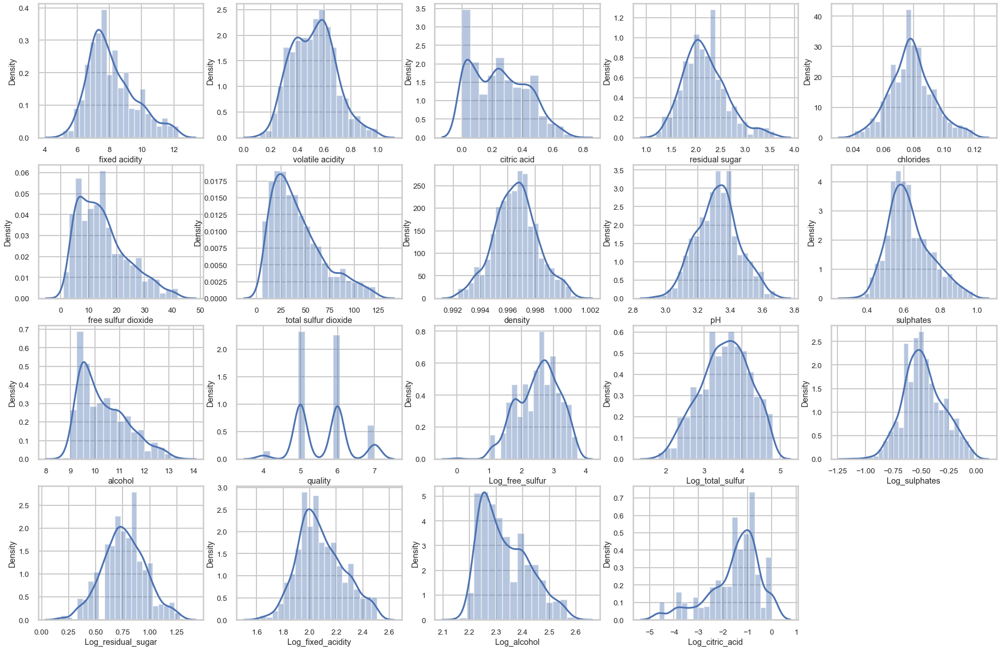

In [268]:
# Histograms after outliers removed and variables log transformed
plt.figure(figsize=(30,25))
for i, c in enumerate(wine1_out):
    plt.subplot(5,5, i+1)
    sns.distplot(wine1_out[c])

plt.show()

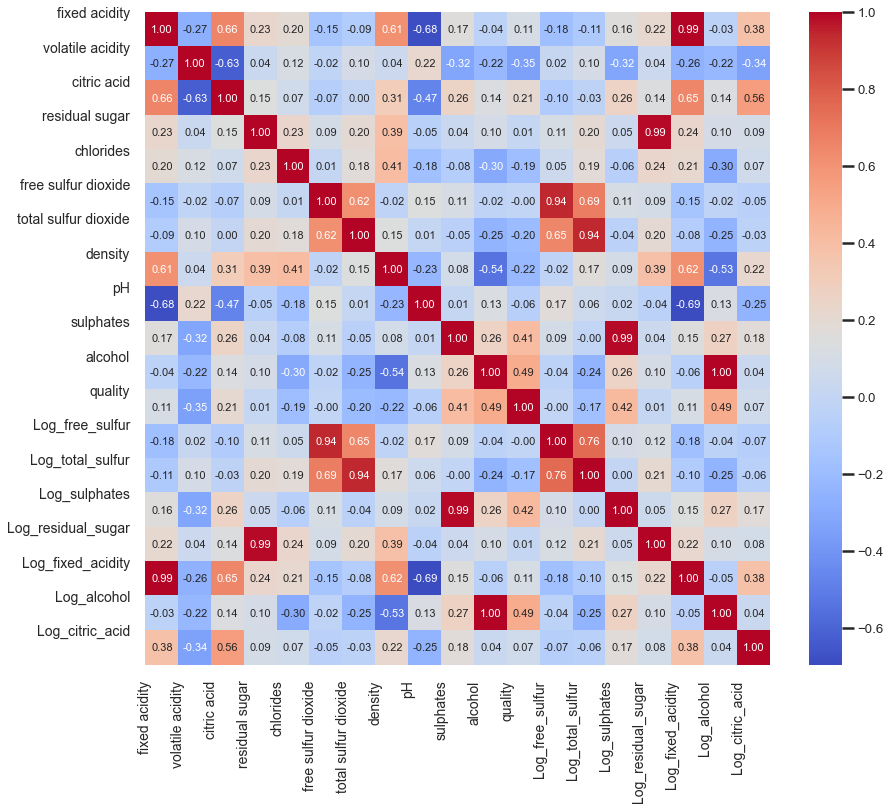

In [269]:
corr = wine1_out.corr()

#Plot figsize
fig, ax = plt.subplots(figsize=(14,12))
dropSelf = np.zeros_like(corr)
dropSelf[np.triu_indices_from(dropSelf)] = False

#Generate Heat Map, allow annotations and place floats in map
sns.heatmap(corr, cmap='coolwarm', annot=True, fmt=".2f", mask=dropSelf, annot_kws={"size":11})

#Apply xticks
plt.xticks(range(len(corr.columns)), corr.columns, fontsize=14);
#Apply yticks
plt.yticks(range(len(corr.columns)), corr.columns, fontsize=14)
#show plot
plt.show()

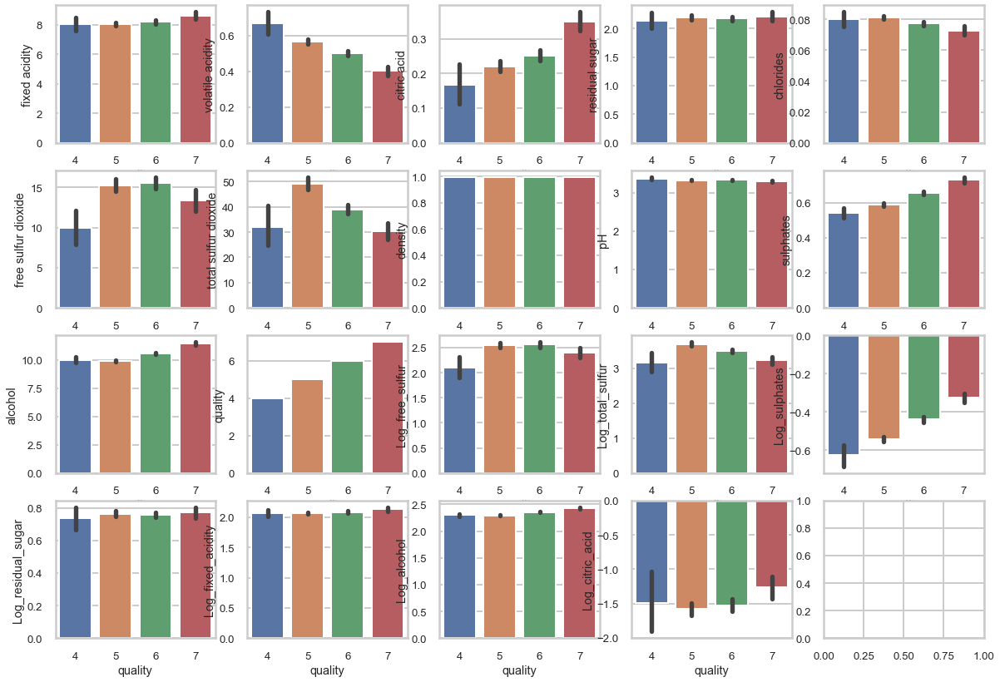

In [270]:
fig, ax1 = plt.subplots(4,5, figsize=(20,14))
k = 0
for i in range(4):
    for j in range(5):
        if k != 19:
            sns.barplot('quality',wine1_out.iloc[:,k], data=wine1_out, ax = ax1[i][j])
            k += 1
plt.show()

In [271]:
wine1_out['quality'].value_counts()

5    513
6    498
7    135
4     33
Name: quality, dtype: int64

In [272]:
# Inserting a new column in the database based on wine quality condition: rating (high, medium and low)
rating =[]
for row in wine1_out['quality']:
    if row == 4: rating.append('Low')
    elif row ==7: rating.append('High')
    else: rating.append('Medium')   

In [273]:
wine1_out['rating'] = rating

In [274]:
# To know about the wine rating group sizes 
wine1_out.groupby('rating').count()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Log_free_sulfur,Log_total_sulfur,Log_sulphates,Log_residual_sugar,Log_fixed_acidity,Log_alcohol,Log_citric_acid
rating,,,,,,,,,,,,,,,,,,,
High,135,135,135,135,135,135,135,135,135,135,135,135,135,135,135,135,135,135,135
Low,33,33,33,33,33,33,33,33,33,33,33,33,33,33,33,33,33,33,33
Medium,1011,1011,1011,1011,1011,1011,1011,1011,1011,1011,1011,1011,1011,1011,1011,1011,1011,1011,1011


# 8. Comparing variables against target variable = quality

<Figure size 360x216 with 0 Axes>

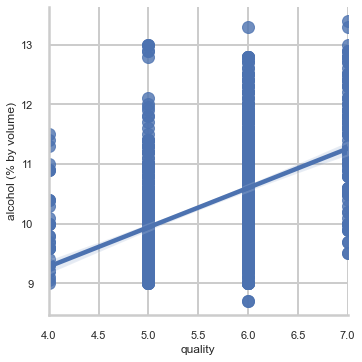

In [287]:
fig = plt.figure(figsize = (5,3))
ax = sns.set_context('poster', font_scale=0.5)
ax = sns.lmplot(x='quality', y= 'alcohol', data= wine1_out, fit_reg = True)
ax.set(ylabel= 'alcohol (% by volume)')
# alcohol has a moderate positive correlation (+0.49) with the target variable (quality) after removing outliers and transforming the data (before taht the correlation was (+0.48).
# alcohol is higher for high quality wine 

<Figure size 360x216 with 0 Axes>

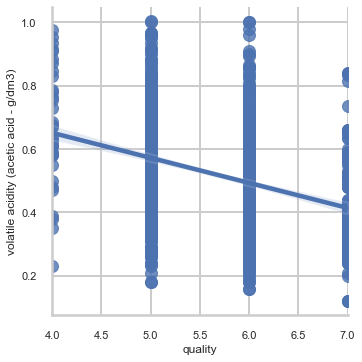

In [288]:
fig = plt.figure(figsize = (5,3))
ax = sns.set_context('poster', font_scale=0.5)
ax = sns.lmplot(x='quality', y= 'volatile acidity', data= wine1_out, fit_reg = True)
ax.set(ylabel= 'volatile acidity (acetic acid - g/dm3)')
# volatile acidity has a moderate negative correlation (-0.35) with the target variable (quality) after removing outliers (before that, the correlation was (-0.39).
# volatile acidity is lower for high quality wine 

<Figure size 360x216 with 0 Axes>

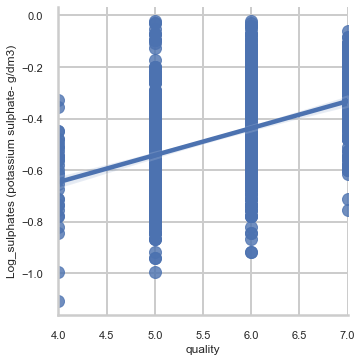

In [289]:
fig = plt.figure(figsize = (5,3))
ax = sns.set_context('poster', font_scale=0.5)
ax = sns.lmplot(x='quality', y= 'Log_sulphates', data= wine1_out, fit_reg = True)
ax.set(ylabel= 'Log_sulphates (potassium sulphate- g/dm3)')
# sulphates has a moderate positive correlation (+0.42) with the target variable (quality) after removing outliers and transformations (before that, the correlation was (0.25).
# sulphates is higher for high quality wine 

<Figure size 360x216 with 0 Axes>

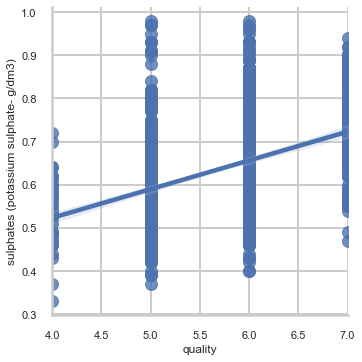

In [290]:
fig = plt.figure(figsize = (5,3))
ax = sns.set_context('poster', font_scale=0.5)
ax = sns.lmplot(x='quality', y= 'sulphates', data= wine1_out, fit_reg = True)
ax.set(ylabel= 'sulphates (potassium sulphate- g/dm3)')
# sulphates has a moderate positive correlation (+0.42) with the target variable (quality) after removing outliers and transformations (before that, the correlation was (0.25).
# sulphates is higher for high quality wine 

<Figure size 360x216 with 0 Axes>

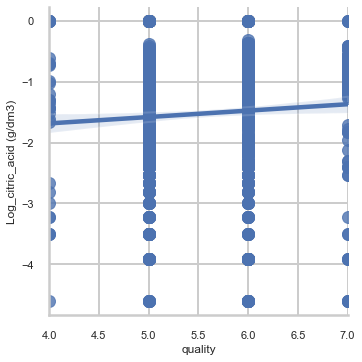

In [291]:
fig = plt.figure(figsize = (5,3))
ax = sns.set_context('poster', font_scale=0.5)
ax = sns.lmplot(x='quality', y= 'Log_citric_acid', data= wine1_out, fit_reg = True)
ax.set(ylabel= 'Log_citric_acid (g/dm3)')
# Log citric acid has a moderate positive correlation (+0.22) with the target variable (quality) after removing outliers and transformations (before that, the correlation was (0.23).
# Log citric acid is higher for high quality wine 

<Figure size 360x216 with 0 Axes>

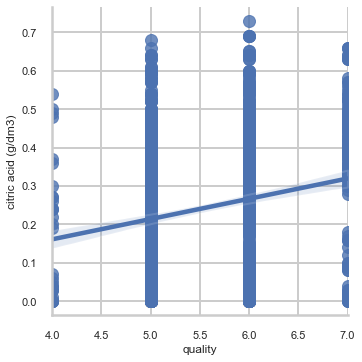

In [292]:
fig = plt.figure(figsize = (5,3))
ax = sns.set_context('poster', font_scale=0.5)
ax = sns.lmplot(x='quality', y= 'citric acid', data= wine1_out, fit_reg = True)
ax.set(ylabel= 'citric acid (g/dm3)')
# Log citric acid has a moderate positive correlation (+0.22) with the target variable (quality) after removing outliers and transformations (before that, the correlation was (0.23).
# Log citric acid is higher for high quality wine 

# Predicting Quality: Linear Regression

In [293]:
wine1_out.shape

(1179, 20)

In [296]:
# ANSWER

X = wine1_out['volatile acidity'].values.reshape(-1,1)
Y = wine1_out['quality'].values.reshape(1,-1)

linreg = LinearRegression()

# The results above tell us that the slope of the linear regression (B1) is -1.5237 and the the intercept (B0) is 6.4204

In [298]:
# finding r score in another way: r is the correlation between the predicted values and the observed values of Y, in this case quite low 0.1203 (range from -1 to 1)
reg = LinearRegression().fit(X, Y)
reg.score(X, Y)

0.12038269501009724

In [314]:
# slope = b1 (b)
reg.coef_

array([-1.52374004])

In [315]:
# intercept = b0 (a)
reg.intercept_

6.420426517281393

In [299]:
# ANSWER: finding yhat = Mean of quality
wine1_out['yhat'] = wine1_out['quality'].mean()

In [300]:
X = wine1_out['volatile acidity']
Y = wine1_out['quality']
yhat = wine1_out['yhat']

In [301]:
def draw_plot(X, Y, Yhat):
    ### Plot the data
    # create a figure
    fig = plt.figure(figsize=(15,7))
    # get the axis of that figure
    ax = plt.gca()

    # plot a scatter plot on it with our data
    ax.scatter(X, Y, c='m')
    ax.plot(X, yhat, color='r', markersize=2);
    plt.xlabel('volatile acidity', fontsize=15)
    plt.ylabel('quality', fontsize=15)

    plt.show();

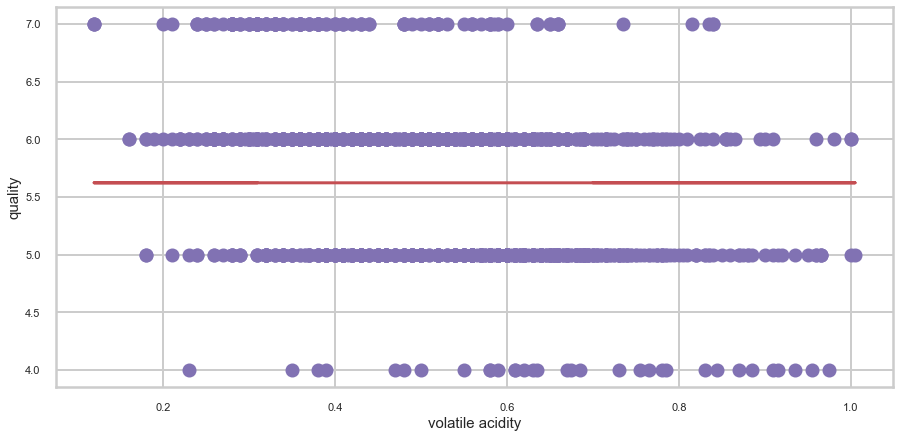

In [302]:
draw_plot(X, Y, yhat)